# Overview

This is an exploratory data analysis on the House Prices Kaggle Competition found at
https://www.kaggle.com/c/house-prices-advanced-regression-techniques
The goal of the competition is to predict the housing price using the provided data but, the purpose of this EDA is to do data analysis and tells story on how we could improve selling price. 

## Description

If you ask a person who wants to buy a house to describe their dream home, they probably won't start by talking about how high the basement ceiling is or how close it is to an east-west railway. But the data from this playground competition shows that more than the number of bedrooms or a white-picket fence affects price negotiations.

The competition asks you to guess the final price of each home in Ames, Iowa, based on 79 variables that describe (almost) everything about them.

There are **1460 training data** and **1460 test data**. There are a total of 81 attributes, 36 of which are numbers, 43 of which are groups of numbers, plus Id and SalePrice.


### Numerical Features
1stFlrSF, 2ndFlrSF, 3SsnPorch, BedroomAbvGr, BsmtFinSF1, BsmtFinSF2, BsmtFullBath, BsmtHalfBath, BsmtUnfSF, EnclosedPorch, Fireplaces, FullBath, GarageArea, GarageCars, GarageYrBlt, GrLivArea, HalfBath, KitchenAbvGr, LotArea, LotFrontage, LowQualFinSF, MSSubClass, MasVnrArea, MiscVal, MoSold, OpenPorchSF, OverallCond, OverallQual, PoolArea, ScreenPorch, TotRmsAbvGrd, TotalBsmtSF, WoodDeckSF, YearBuilt, YearRemodAdd, YrSold

### Categorical Features
Alley, BldgType, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, BsmtQual, CentralAir, Condition1, Condition2, Electrical, ExterCond, ExterQual, Exterior1st, Exterior2nd, Fence, FireplaceQu, Foundation, Functional, GarageCond, GarageFinish, GarageQual, GarageType, Heating, HeatingQC, HouseStyle, KitchenQual, LandContour, LandSlope, LotConfig, LotShape, MSZoning, MasVnrType, MiscFeature, Neighborhood, PavedDrive, PoolQC, RoofMatl, RoofStyle, SaleCondition, SaleType, Street, Utilitif

In [1]:
numFeatures =  ["1stFlrSF","2ndFlrSF","3SsnPorch","BedroomAbvGr","BsmtFinSF1","BsmtFinSF2","BsmtFullBath","BsmtHalfBath","BsmtUnfSF","EnclosedPorch","Fireplaces","FullBath","GarageArea","GarageCars","GarageYrBlt","GrLivArea","HalfBath","KitchenAbvGr","LotArea","LotFrontage","LowQualFinSF","MSSubClass","MasVnrArea","MiscVal","MoSold","OpenPorchSF","OverallCond","OverallQual","PoolArea","ScreenPorch","TotRmsAbvGrd","TotalBsmtSF","WoodDeckSF","YearBuilt","YearRemodAdd","YrSold"]



## Imports and Download Data

In [2]:
import pandas as pd
import numpy as np
from copy import deepcopy
import scipy.stats as st
from sklearn import ensemble, tree, linear_model
import missingno as msno

#plotting lib
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go

pio.renderers.default = "jupyterlab"
from plotly.subplots import make_subplots

# enable comparing table side by side
from IPython.display import display, HTML

CSS = """
.output {
    flex-direction: row;
}
"""

HTML('<style>{}</style>'.format(CSS))

In [55]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler,quantile_transform
from statsmodels.graphics.gofplots import qqplot
from scipy.stats import skew

In [4]:
!kaggle competitions download -c house-prices-advanced-regression-techniques
!unzip house-prices-advanced-regression-techniques.zip -d ./data -y
!pip install -U kaleido


house-prices-advanced-regression-techniques.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  house-prices-advanced-regression-techniques.zip
caution: filename not matched:  -y


In [5]:
train = pd.read_csv('./data/train.csv')
test = pd.read_csv('./data/test.csv')

# Getting Started

Obtaining a simple summary of your data is a fundamental first step in this direction. Thus, the term "basic description of your data" is somewhat general, since it can mean anything from "a quick and dirty approach to get some information on your data" to "a means to get some simple, easy-to-understand information on your data" or even "a way to get a basic feel for your data." When using the describe() function, we can obtain several types of summary statistics, all of which will be free of NaN values.

There are two factors mostly observed in EDA exercise which are missing values and outliers. which we will cover missing value first and then we well have good look at the outliers.


In [6]:
display(train.describe().T)
# display(test.describe().T)

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


## Looking at the missing number

Several approaches to examine missing data in a dataset are:

1. **Missing data patterns**: Examine your data's missingness patterns before studying it. Bar charts, heatmaps, and dendrograms can help. These visualisations might help you determine whether missing data is random or non-random and whether missing values in distinct variables are related.

2. **Missing data imputation**: Estimating missing values is another method for studying missing data. Imputation methods include mean, median, regression, and many.

3. **Data reduction** : If a lot of data is missing, lower the number of variables or cases. Principal component analysis, factor analysis, and data clustering can do this.

4. **Sensitivity analysis**: This method tests conclusions by changing missing data assumptions. It can identify if an analysis is sensitive to missing data handling.

5. **Model-based analysis**: In model-based analysis, missing data is treated as an additional variable, and a statistical model estimates the associations between the missing values and the other variables in the dataset.


### Finding the pattern and imputation


The library ["Missingno"](https://github.com/ResidentMario/missingno) is a library that provides a set of tools for visualizing and analyzing missing data. It's commonly used in data science and machine learning projects to help identify and handle missing or incomplete data in datasets.

Missingno can generate a variety of visualizations to help us understand the distribution and patterns of missing values in their data, including bar charts, heatmaps, and dendrograms. It can also be used to impute missing values or drop them entirely from a dataset.

Text(0.5, 1.0, 'Raw Data Completeness')

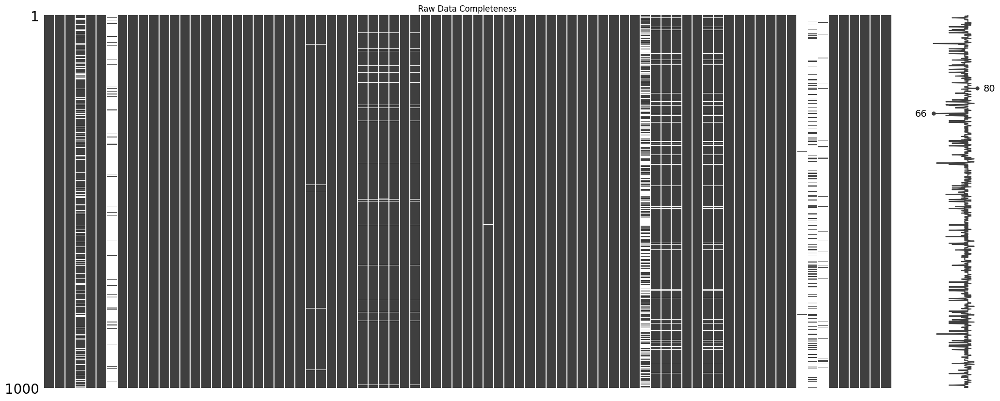

In [7]:
ax = msno.matrix(train.sample(1000))
ax.set_title("Raw Data Completeness")

Text(0.5, 1.0, 'Data Completeness visualisation')

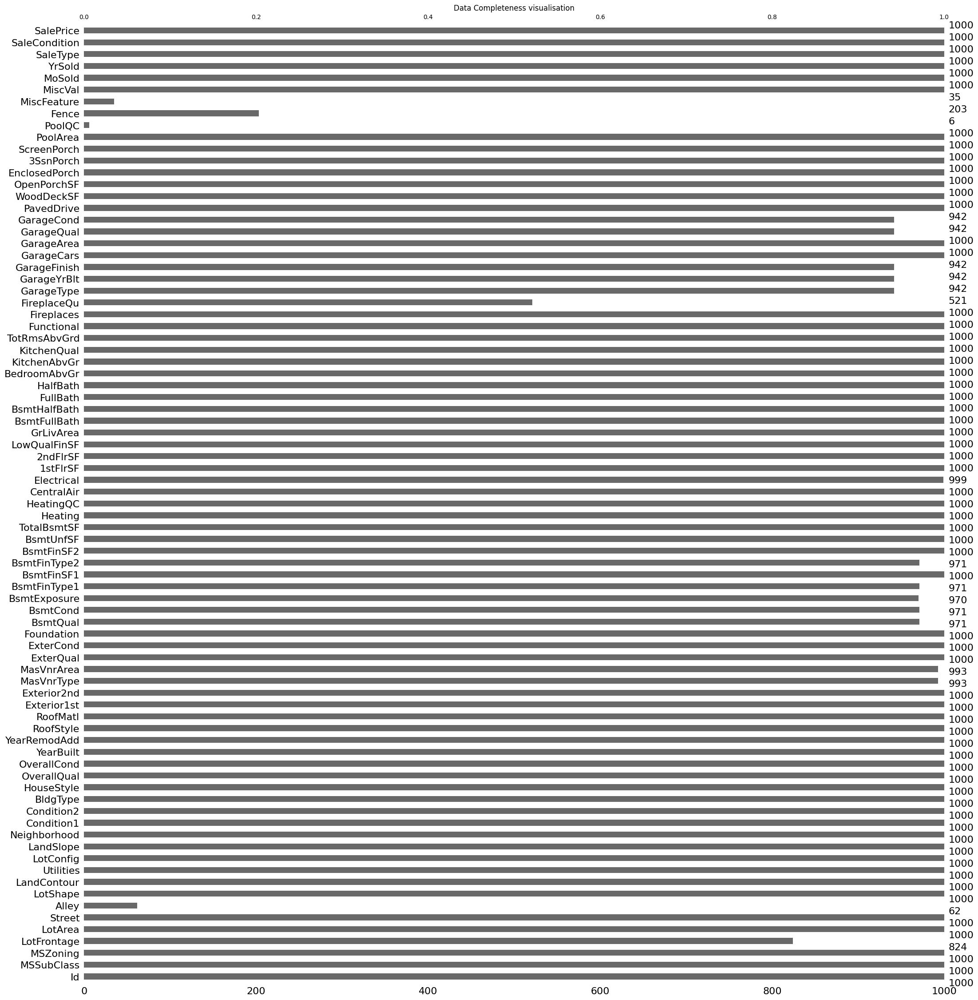

In [8]:
ax = msno.bar(train.sample(1000))
ax.set_title("Data Completeness visualisation")

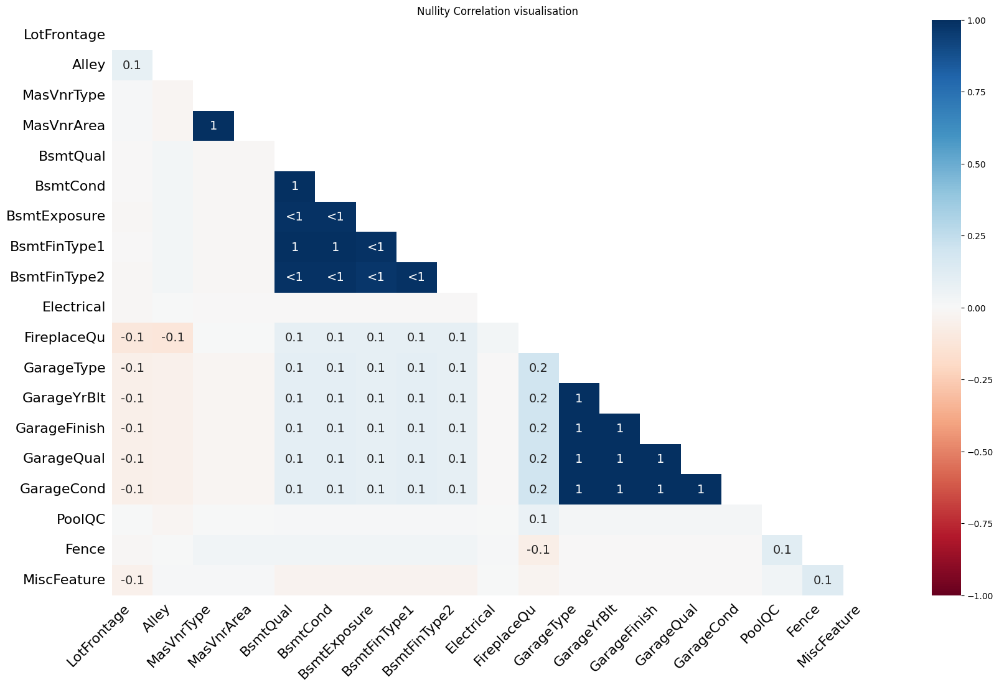

In [9]:
ax = msno.heatmap(train)
_ = ax.set_title("Nullity Correlation visualisation")

#### Nullity correlation and Dendrogram
The range of nullity correlation is from -1 (if one variable appears, the other surely does not) to 0 (if the presence or absence of one variable has no effect on the other) to 1. (if one variable appears the other definitely also does). You can quickly see that the *Garage* group and the *Bsmt* group are very correlated in the *Nullity Correlation visualisation* chart.

And below will be displaying the heirachy of missing values. which allows us to look deeper in to how things could be collected. for example 

1. GarageCond and other Garage_ features are likely depended on each other or might be collected at the sametime
2. interms of data collection, listing Fence might be more important than getting MiscFeature.

<AxesSubplot: >

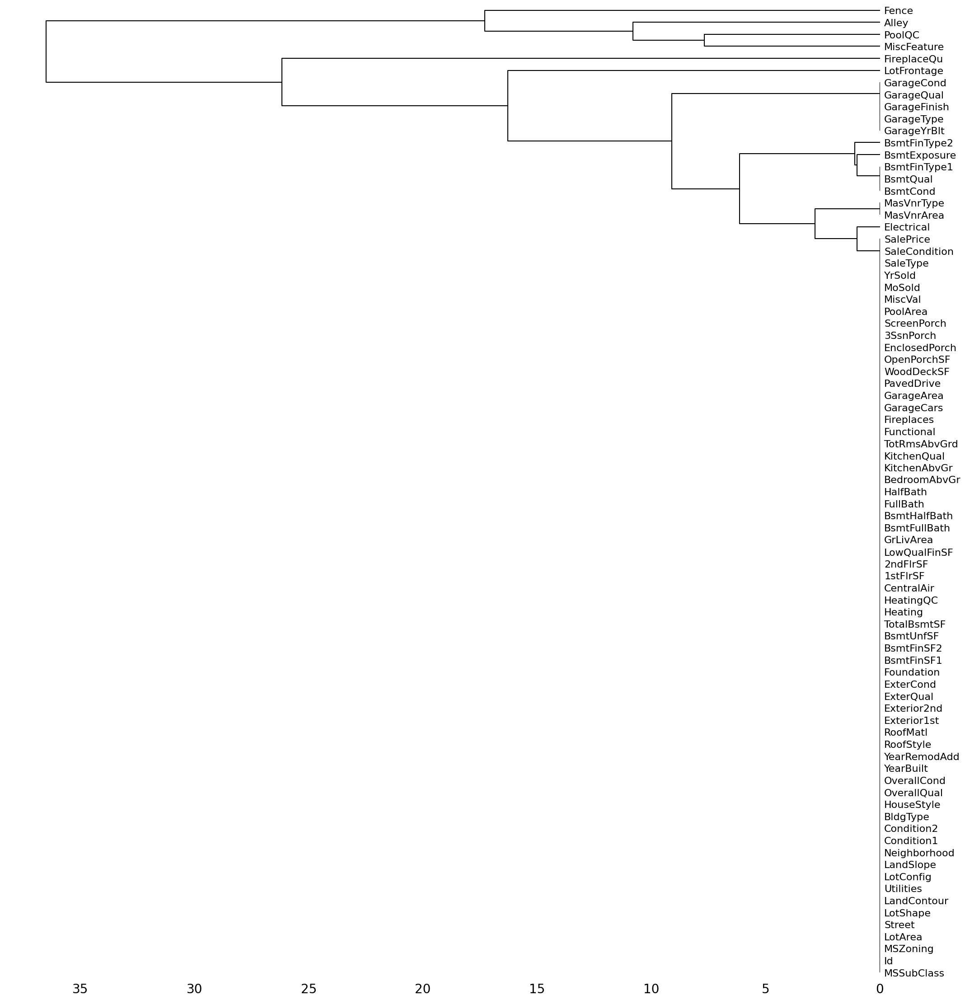

In [10]:
msno.dendrogram(train)

## Analysing our target
a quick look at SalePrice. There are a few things that we could look.

1. Time
2. Correlation
3. Trends

### Time
Hypothesis
> It is a common knowledge that money inflates over time. Therefor Housing Price should increase over time

But it isnt. How intreguing.

Hypothesis 2 
> Newer Houses Sold For More

It is... for most cases. Houses that were built before 1940 seems to sold for much more in some cases



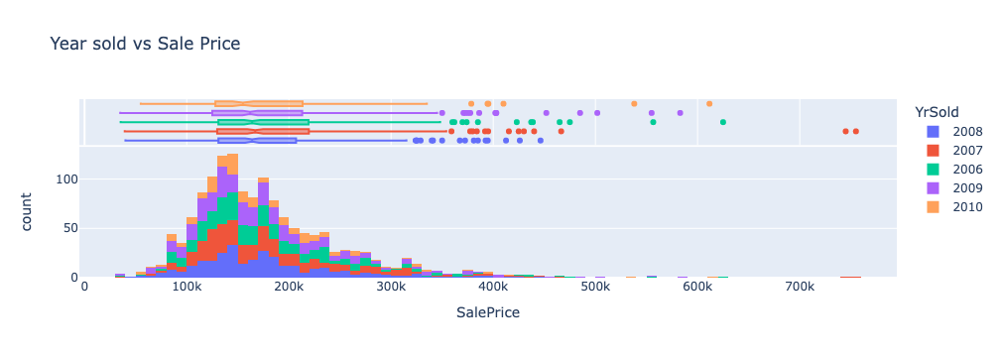

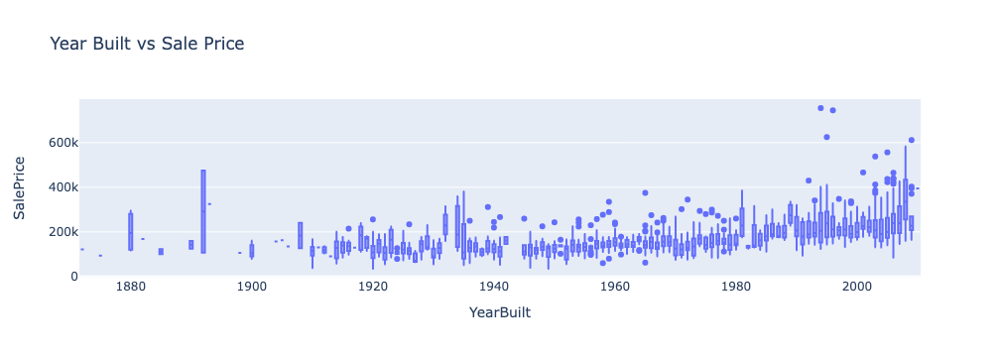

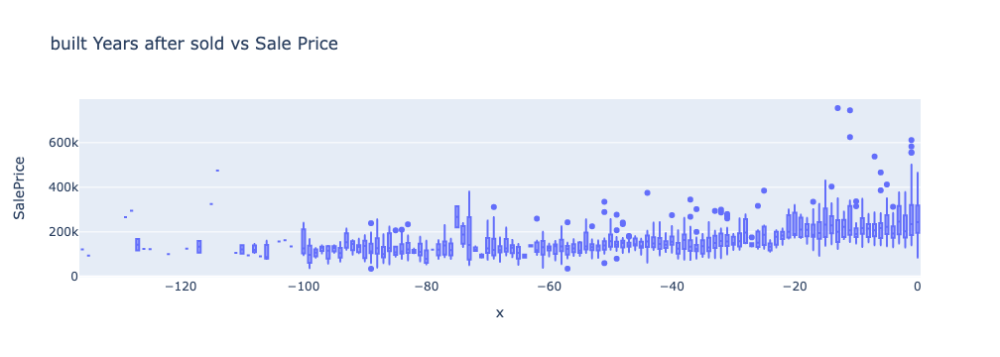

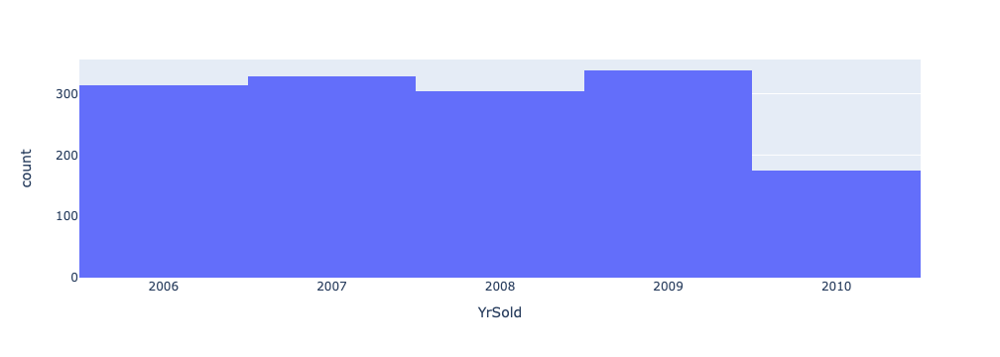

In [11]:
fig = px.histogram(train,color="YrSold", x="SalePrice",marginal="box",
                   hover_data=train.columns,title="Year sold vs Sale Price")
display(fig)
fig = px.box(train,y="SalePrice",x="YearBuilt",
                   hover_data=train.columns , title="Year Built vs Sale Price")
display(fig)
fig = px.box(train,y="SalePrice",x=-train["YrSold"]+train["YearBuilt"],
                   hover_data=train.columns,title="built Years after sold vs Sale Price")
display(fig)
fig = px.histogram(train,x="YrSold",
                   hover_data=train.columns)
display(fig)



To summarize, our analysis shows that newer houses sell for a higher price, while the price remains stable between 2008 and 2010. However, the number of houses sold per year has decreased, or the data for 2010 is incomplete.
## Correlation
We also found a strong correlation between the overall quality of a house and its sale price. However, this raises concerns because the overall quality is determined after the housing evaluation and is highly correlated with the living area. It may be more appropriate to use a formula that includes both living area and quality to predict the price.
#### the Opportunities present (1)
Our analysis suggests two opportunities: first, to find houses that can be bought for less and sold for more, and second, to explore the potential of house flipping by improving the overall quality of a house to increase its price.

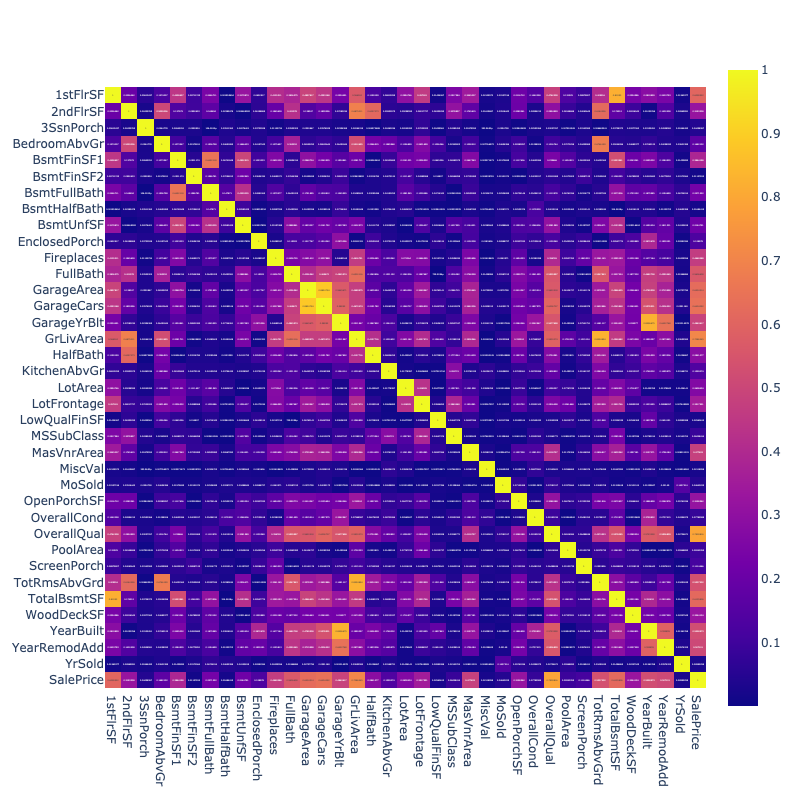

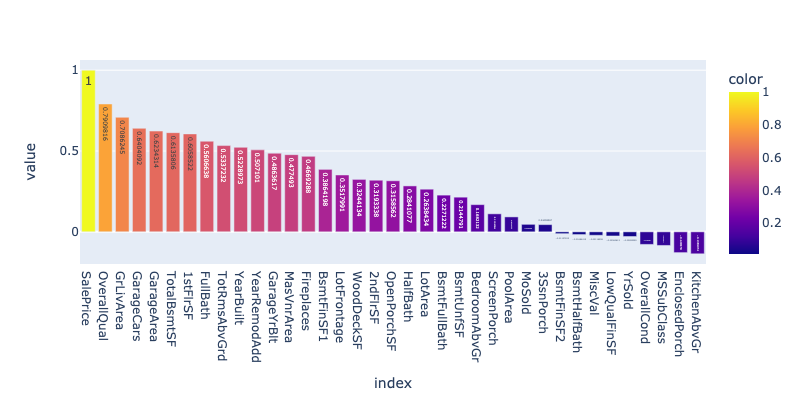

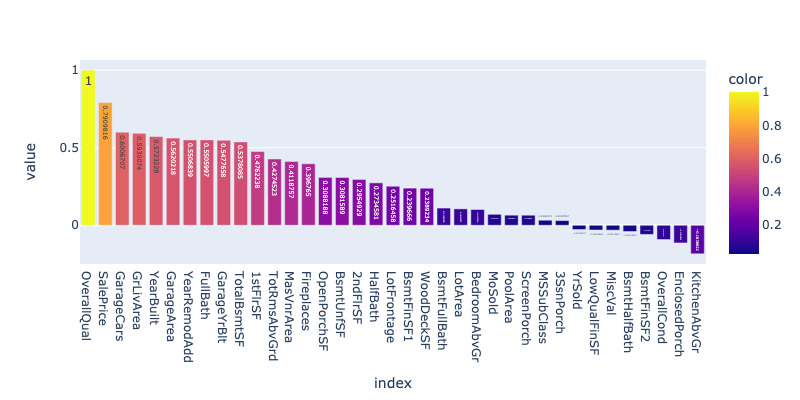

In [12]:
corr = (train[[*numFeatures,"SalePrice"]].corr())

fig = px.imshow(abs(corr),width=800, height=800,text_auto=True,)
fig.show()
_corr = corr["SalePrice"].sort_values(ascending=False)
fig = px.bar(_corr,color=abs(_corr),text_auto=True,
            width=800, height=400)
fig.show()

_corr = corr["OverallQual"].sort_values(ascending=False)
fig = px.bar(_corr,color=abs(_corr),text_auto=True,
            width=800, height=400)
fig.show()

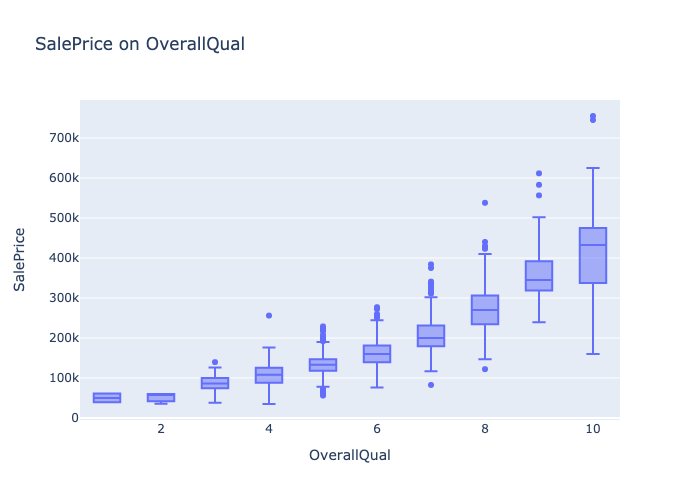

The chart here shows that house tend to sells higher with better Overall Quality


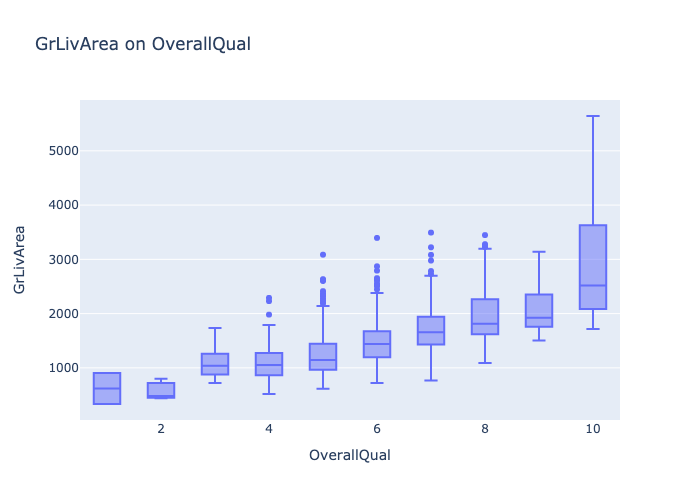

The chart here shows that with better living area are likly to recieve better Overall Quality


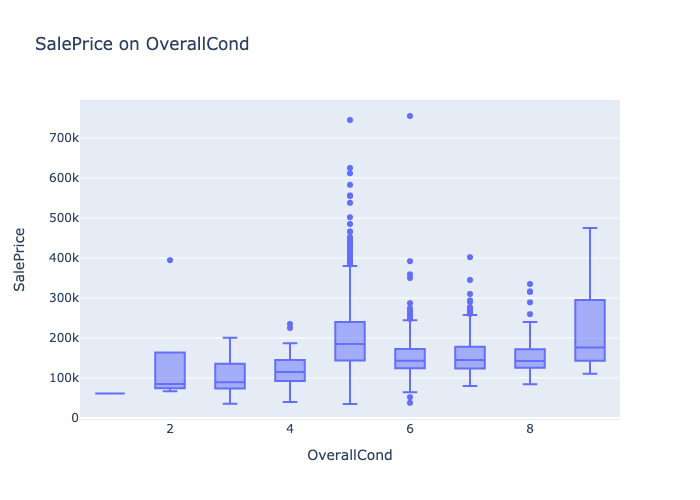

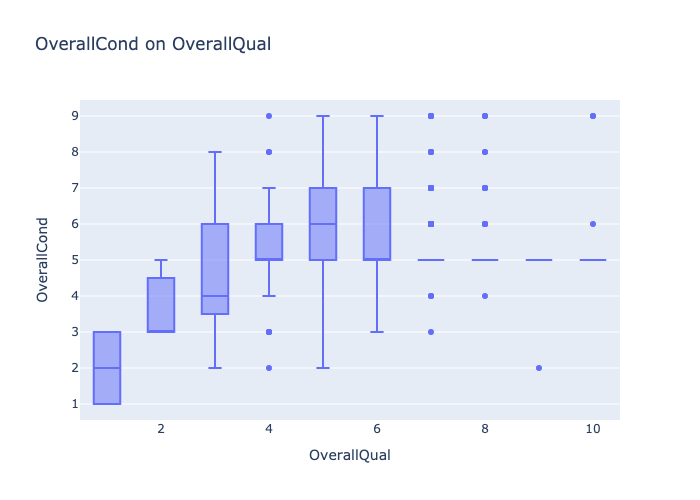

In [13]:
fig = px.box(
    train, 
    y="SalePrice", 
    x= "OverallQual",
    title="SalePrice on OverallQual")
display(fig)
print("The chart here shows that house tend to sells higher with better Overall Quality")
fig = px.box(
    train, 
    y="GrLivArea", 
    x= "OverallQual",
    title="GrLivArea on OverallQual")
display(fig)
print("The chart here shows that with better living area are likly to recieve better Overall Quality")



fig = px.box(
    train, 
    y="SalePrice", 
    x= "OverallCond",
    title="SalePrice on OverallCond")
display(fig)

fig = px.box(
    train, 
    y="OverallCond", 
    x= "OverallQual",
    title="OverallCond on OverallQual")
display(fig)

In [112]:
skewness = train[numFeatures].apply(lambda x : pd.Series({
    "skew":skew(x, axis=0, bias=True),
})).T
display(skewness.T)
skew_fixed = deepcopy(train)

positiveSkewed = skewness[skewness["skew"].apply(lambda x :x > 1.0)].index
skew_fixed[positiveSkewed] = MinMaxScaler().fit_transform(skew_fixed[positiveSkewed])
skew_fixed[positiveSkewed] = skew_fixed[positiveSkewed].transform(lambda x : np.log(x+1e-5))
skew_fixed[positiveSkewed] = MinMaxScaler().fit_transform(skew_fixed[positiveSkewed])
skewness = skew_fixed[numFeatures].apply(lambda x : pd.Series({
    "skew":skew(x, axis=0, bias=True),
})).T
display(skewness.T)

,1stFlrSF,2ndFlrSF,3SsnPorch,BedroomAbvGr,BsmtFinSF1,BsmtFinSF2,BsmtFullBath,BsmtHalfBath,BsmtUnfSF,EnclosedPorch,...,OverallCond,OverallQual,PoolArea,ScreenPorch,TotRmsAbvGrd,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold
skew,1.375342,0.812194,10.293752,0.211572,1.683771,4.250888,0.595454,4.099186,0.919323,3.086696,...,0.692355,0.216721,14.813135,4.117977,0.675646,1.522688,1.539792,-0.612831,-0.503044,0.09617


,1stFlrSF,2ndFlrSF,3SsnPorch,BedroomAbvGr,BsmtFinSF1,BsmtFinSF2,BsmtFullBath,BsmtHalfBath,BsmtUnfSF,EnclosedPorch,...,OverallCond,OverallQual,PoolArea,ScreenPorch,TotRmsAbvGrd,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold
skew,-4.317295,0.812194,7.638968,0.211572,-0.690648,2.457722,0.595454,3.856135,0.919323,2.062311,...,0.692355,0.216721,14.341241,3.119385,0.675646,-5.557224,0.104757,-0.612831,-0.503044,0.09617


In [87]:
skewness.apply(lambda x :x > 0.3)

,skew
1stFlrSF,True
2ndFlrSF,True
3SsnPorch,True
BedroomAbvGr,False
BsmtFinSF1,True
BsmtFinSF2,True
BsmtFullBath,True
BsmtHalfBath,True
BsmtUnfSF,True
EnclosedPorch,True


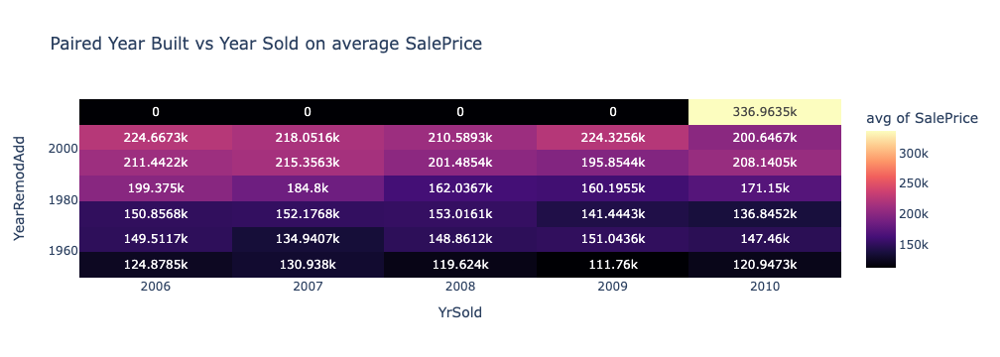

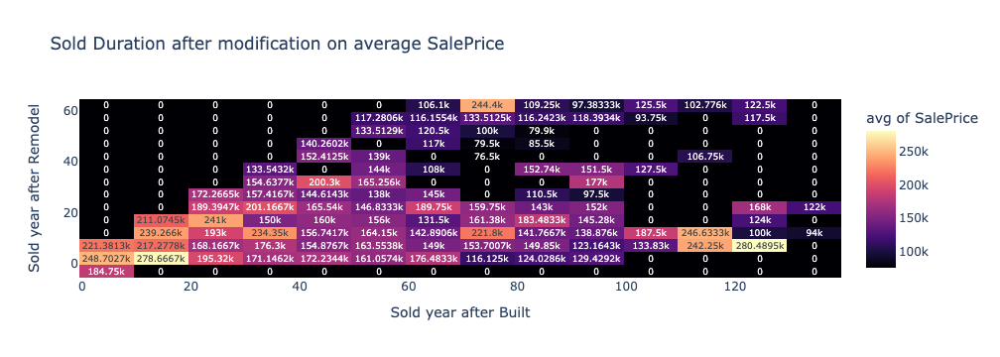

In [86]:
fig = px.density_heatmap(train, 
                         x="YrSold", 
                         y="YearBuilt", 
                         nbinsx=8, nbinsy=10, 
                         color_continuous_scale="Magma",
                         z="SalePrice", histfunc="avg",text_auto=True,
                         title="Paired Year Built vs Year Sold on average SalePrice"
                        )

fig.show()
fig = px.density_heatmap(train, 
                         x="YrSold", 
                         y="YearRemodAdd", 
                         nbinsx=8, nbinsy=10, 
                         color_continuous_scale="Magma",
                         z="SalePrice", histfunc="avg",text_auto=True,
                         title="Paired Year Built vs Year Sold on average SalePrice"
                        )
fig.show()

fig = px.density_heatmap(train, 
                         x=train["YrSold"] - train["YearBuilt"], 
                         y=train["YrSold"] - train["YearRemodAdd"], 
                         labels={
                             "x": "Sold year after Built",
                             "y": "Sold year after Remodel"
                         },
                         nbinsx=20, nbinsy=20, 
                         color_continuous_scale="Magma",
                         z="SalePrice", histfunc="avg",text_auto=True,
                         title="Sold Duration after modification on average SalePrice"
                        )
fig.show()


## Data Skewness

We can quickly look through all of our data distribution and skewness by min max scaling and make a box plot containing all of the numerical features

To quote the NIST Engineering Statistics Handbook:
>In regression modeling, we often apply transformations to achieve the following two goals:
>1. to satisfy the homogeneity of variances assumption for the errors.
>2. to linearize the fit as much as possible.
>
>Some care and judgment is required in that these two goals can conflict. We generally try to achieve homogeneous variances first and then address the issue of trying to linearize the fit.

But this is not important to what we are trying to achieve yet. So I will demonstrate how to quickly fix skewness.

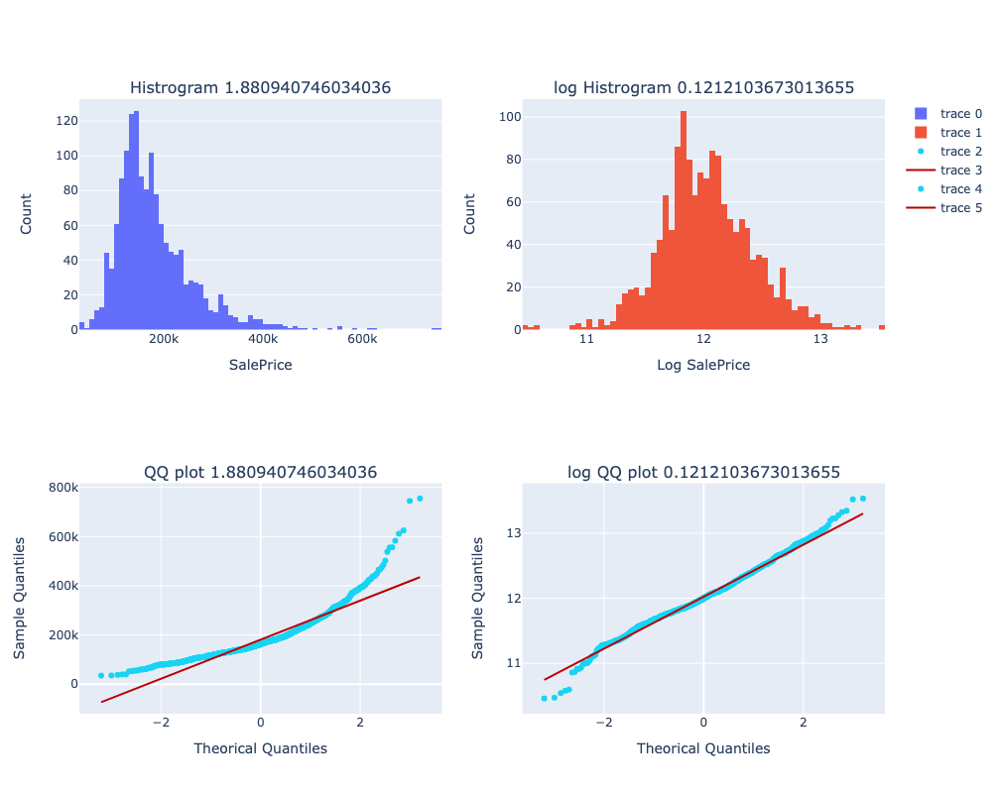

2

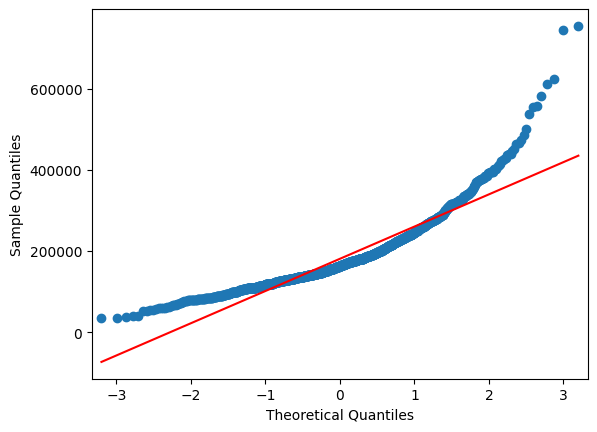

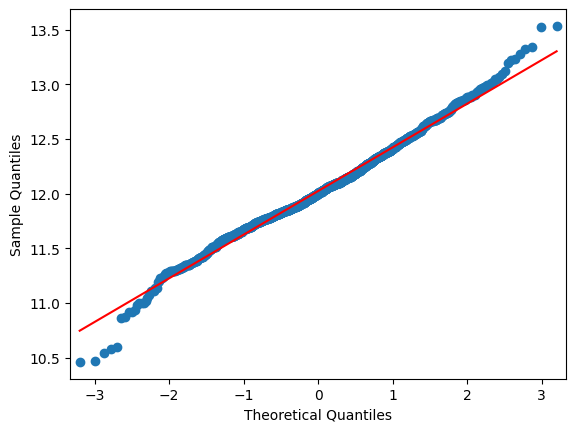

In [113]:

original = train["SalePrice"]
o_skew = skew(original, axis=0, bias=True)

transformed = np.log(original)
t_skew = skew(transformed, axis=0, bias=True)

qqplot_ori = qqplot(original, line='s').gca().lines
qqplot_tran = qqplot(transformed, line='s').gca().lines

fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=(
        f"Histrogram {o_skew}", 
        f"log Histrogram {t_skew}",
        f"QQ plot {o_skew}", 
        f"log QQ plot {t_skew}" 
    ))


Trace1 = go.Histogram(
        x=original,
    )

Trace2 = go.Histogram(x=transformed)

fig.add_trace(
    Trace1,
    row=1, col=1
)
fig.add_trace(
    Trace2,
    row=1, col=2
)
fig.add_trace({
        'type': 'scatter',
        'x': qqplot_ori[0].get_xdata(),
        'y': qqplot_ori[0].get_ydata(),
        'mode': 'markers',
        'marker': {
            'color': '#19d3f3'
        }

    },
    row=2, col=1)
fig.add_trace({
        'type': 'scatter',
        'x': qqplot_ori[1].get_xdata(),
        'y': qqplot_ori[1].get_ydata(),
        'mode': 'lines',
        'marker': {
            'color': '#b00'
        }

    },
    row=2, col=1)


fig.add_trace({
        'type': 'scatter',
        'x': qqplot_tran[0].get_xdata(),
        'y': qqplot_tran[0].get_ydata(),
        'mode': 'markers',
        'marker': {
            'color': '#19d3f3'
        }

    },
    row=2, col=2)
fig.add_trace({
        'type': 'scatter',
        'x': qqplot_tran[1].get_xdata(),
        'y': qqplot_tran[1].get_ydata(),
        'mode': 'lines',
        'marker': {
            'color': '#b00'
        }

    },
    row=2, col=2)

fig['layout']['xaxis']['title']='SalePrice'
fig['layout']['xaxis2']['title']='Log SalePrice'
fig['layout']['yaxis']['title']='Count'
fig['layout']['yaxis2']['title']='Count'

fig['layout']['xaxis3']['title']='Theorical Quantiles'
fig['layout']['xaxis4']['title']='Theorical Quantiles'
fig['layout']['yaxis3']['title']='Sample Quantiles'
fig['layout']['yaxis4']['title']='Sample Quantiles'



fig.update_layout(
    autosize=True,
    height=800,
)
fig.show("jupyterlab")


In [114]:
# Performs deepcopy to explore without consequence
cp_train = deepcopy(train)
cp_train[numFeatures] = MinMaxScaler().fit_transform(train[numFeatures])

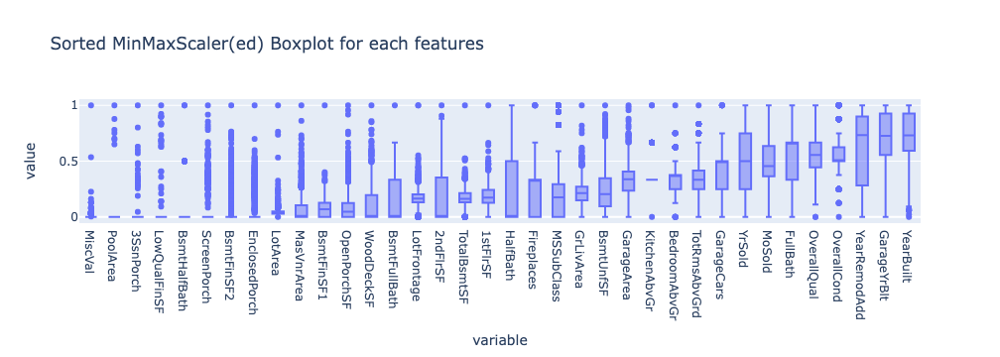

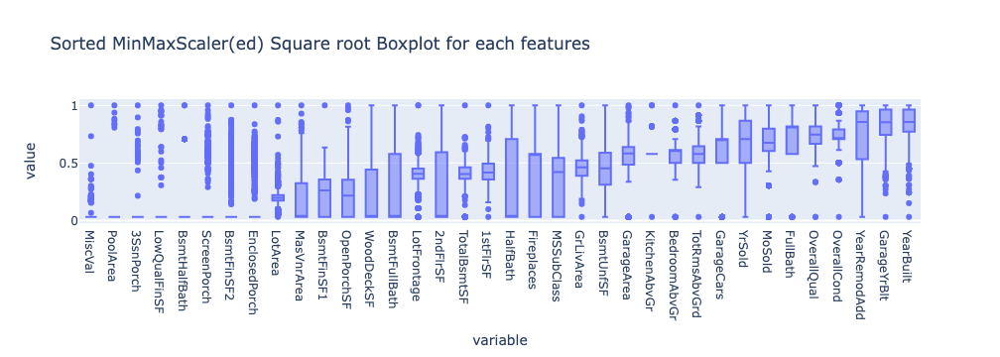

In [115]:
sorted_means = cp_train[numFeatures].apply("mean").sort_values()
fig = px.box(
    cp_train, 
    y=sorted_means.index, 
    title="Sorted MinMaxScaler(ed) Boxplot for each features")
display(fig)

sorted_means = cp_train[numFeatures].apply("mean").sort_values()
fig = px.box(
    cp_train[sorted_means.index].apply(lambda x : np.sqrt(1e-3+x)), 
    y=sorted_means.index,
    title="Sorted MinMaxScaler(ed) Square root Boxplot for each features")
display(fig)

From *Sorted MinMaxScaler(ed) of Boxplot for each features* we can see that most of our data are positively skewed which is something to keep in mind. **The negatively skewed features are revolving around year being remodelled built** which we could remove the bias by simply subtracting a constant.

the features that we will quickly look into the outliers is the lower means one as the graphs shows that most of the values are clustered around 0 which are

"MiscVal", "PoolArea", "3SsnPorch", "LowQualFinSF", "BsmtHaldBatch", "ScreenPorch","BsmtFinSF2", "EnclosedPorch"

and we will see that it resemble sparse matrix

## Outliers

When exploring data, the outliers are the extreme values within the dataset. That means the outlier data points vary greatly from the expected values—either being much larger or significantly smaller. For data that follows a normal distribution, the values that fall more than three standard deviations from the mean are typically considered outliers. 

Outliers can find their way into a dataset naturally through variability, or they can be the result of issues like human error, faulty equipment, or poor sampling. Regardless of how they get into the data, outliers can have a big impact on statistical analysis and machine learning because they impact calculations like mean and standard deviation, and they can skew hypothesis tests. A data analysis should use various techniques to visualize and identify outliers before deciding whether they should be dropped, kept, or modified. 


it is very important to look at the outliers and discover why it is that way.

In [255]:
from itertools import combinations

def IQR_limits(data):
    Q1,Q3 = np.percentile(data , [25,75])
    IQR = Q3 - Q1
    ul = Q3+1.5*IQR
    ll = Q1-1.5*IQR
    return (ll,ul)
def GetOutliers(data):
    ll,ul = IQR_limits(data)
    return data[(data>ul) | (data<ll)].index
def GetColsOutliers(data,cols):
    index = pd.Index(["None"])
    for col in cols:
        index = index.union(GetOutliers(data[col]))
    return index

def OutliersStatistics(dataframe,columns):
    stats = []
    for col in columns:
        ll,ul = IQR_limits(dataframe[col])
        dat = {
            "col":col,
            "iqr_llim":ll,
            "iqr_ulim":ul,
            "likelySparse":ll == ul,
            "nOutliers":GetOutliers(dataframe[col]).shape[0]

        }
        stats.append(dat)
    return pd.DataFrame(stats).set_index("col")


In [256]:
# look at overall quality
# OutliersStatistics(train,numFeatures)
stats = OutliersStatistics(train,numFeatures).sort_values("nOutliers",ascending=False)
na_count = train.isna().agg(sum,axis=0)
na_count.name= "naCount"
stats.join(na_count)

,iqr_llim,iqr_ulim,likelySparse,nOutliers,naCount
col,,,,,
EnclosedPorch,0.000,0.000,True,208,0
BsmtFinSF2,0.000,0.000,True,167,0
OverallCond,3.500,7.500,False,125,0
ScreenPorch,0.000,0.000,True,116,0
MSSubClass,-55.000,145.000,False,103,0
BsmtHalfBath,0.000,0.000,True,82,0
OpenPorchSF,-102.000,170.000,False,77,0
LotArea,1481.500,17673.500,False,69,0
KitchenAbvGr,1.000,1.000,True,68,0


right now you have begin to notice that iqr_lim of EnclosedPorch, BsmtFinSF2 and ... is in the sparse list that we have noted above. Next is diving deeper of what could be dropped either leave it alone or dropping the upper and or lower IQR outliers

interesting example:
1. EnclosedPorch : leave since it is very sparse indicated that house is rarely have an enclosed porch
2. OpenPorchSF : drop only the upper outliers since a sugnificant number of house does not have a porch. \* we could combine EnclosedPorch and OpenPorchSF together since it is very similar and indicate porch area.
3. lotArea : it is safe to drop both





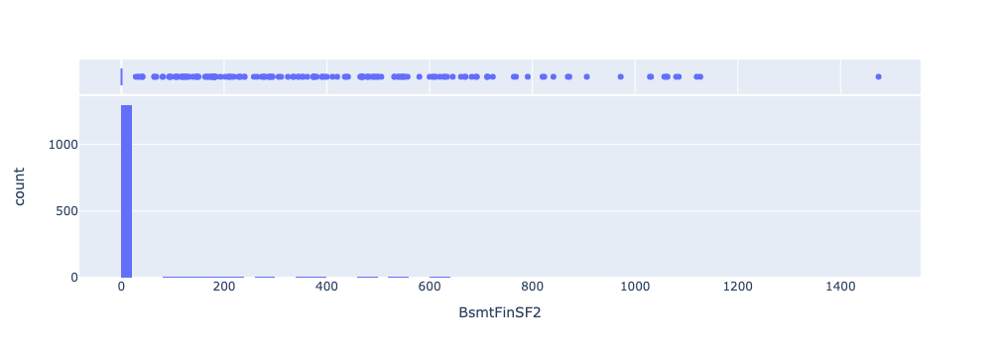

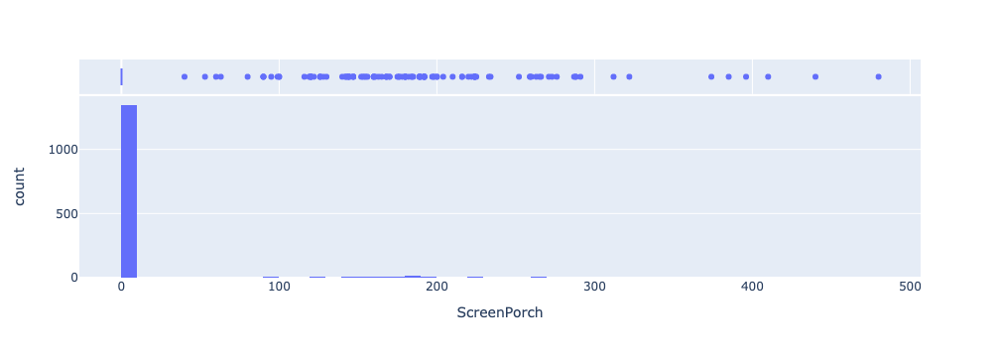

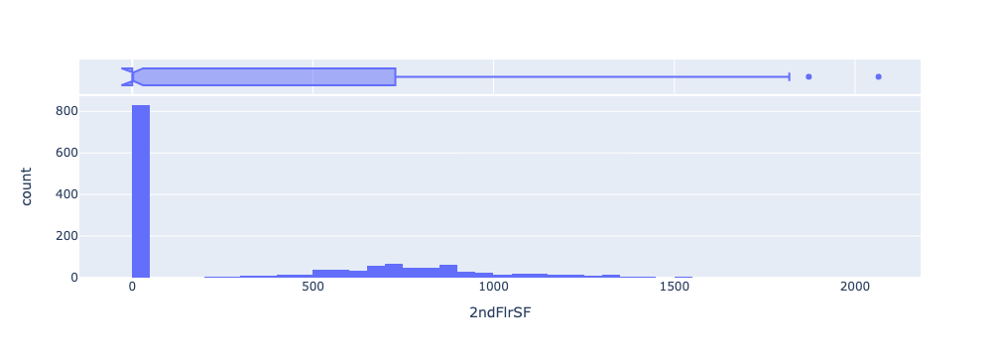

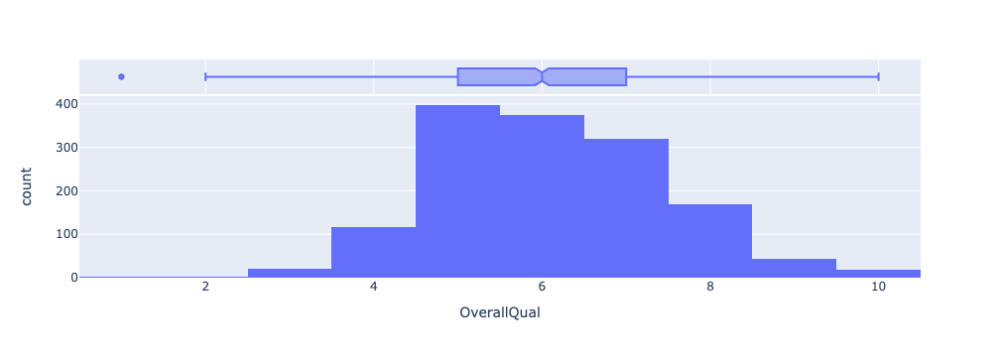

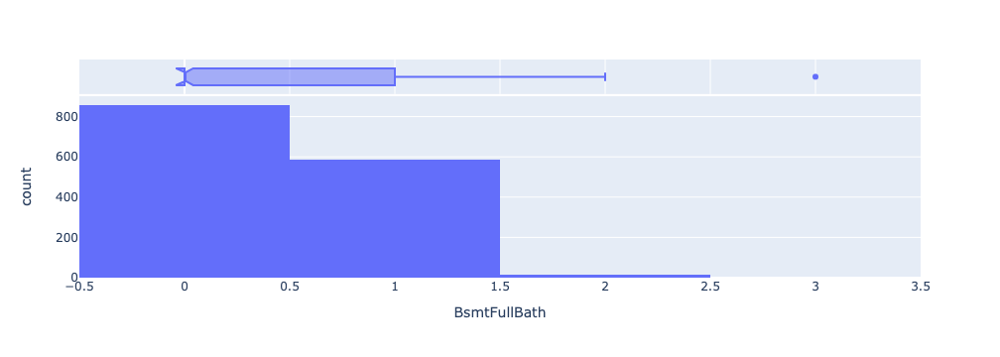

...

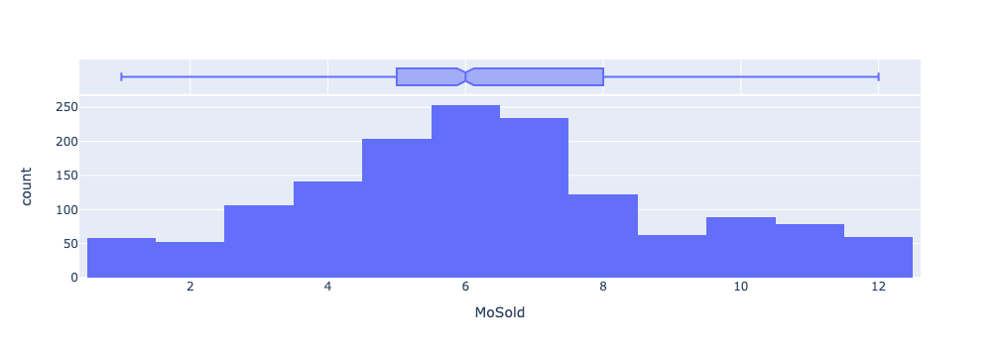

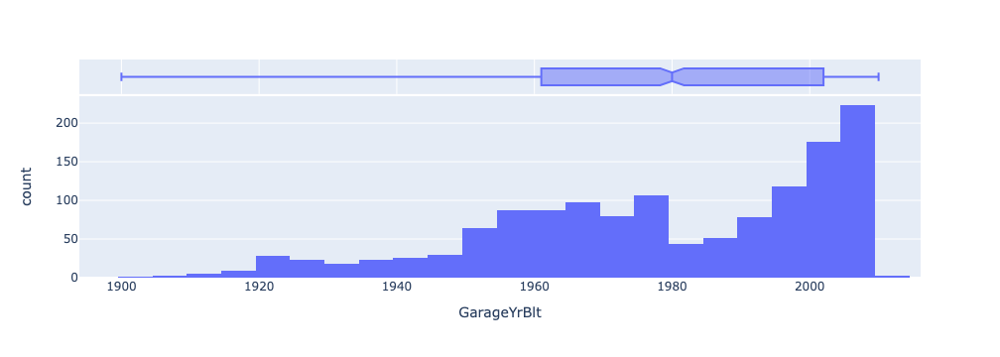

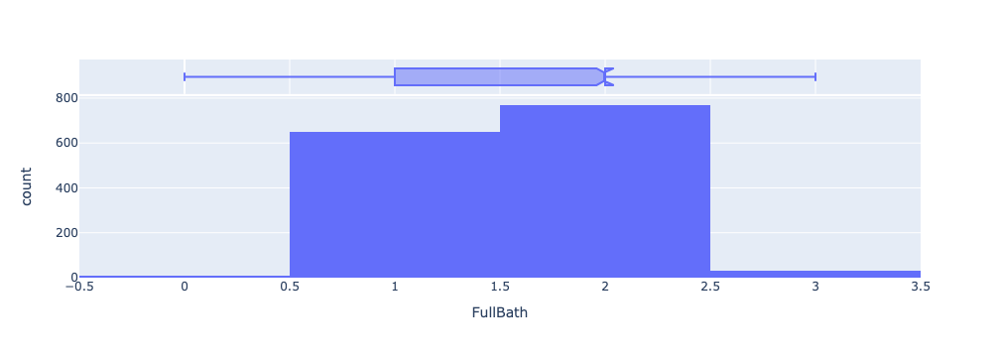

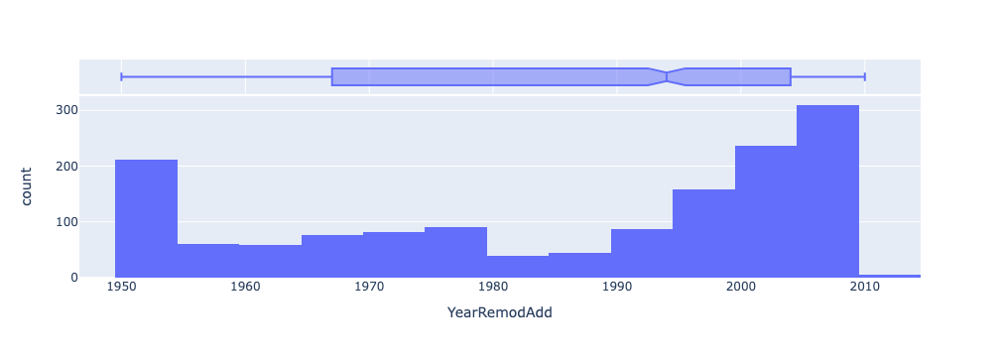

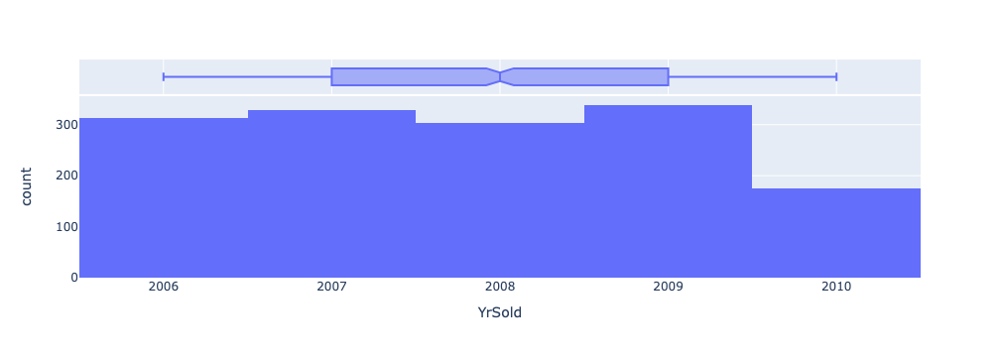

In [267]:

for col in stats.index:
    px.histogram(train,x=col,marginal="box").show()
drop_operations = {
    "OverallCond":"both",
    "OpenPorchSF":"upper",
    
}

In [191]:
dat = train[
    ["MiscVal", "PoolArea", "3SsnPorch", "LowQualFinSF", "BsmtHalfBath", "ScreenPorch","BsmtFinSF2", "EnclosedPorch"]
]
display(dat.describe())
display(dat)

,MiscVal,PoolArea,3SsnPorch,LowQualFinSF,BsmtHalfBath,ScreenPorch,BsmtFinSF2,EnclosedPorch
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,43.489041,2.758904,3.409589,5.844521,0.057534,15.060959,46.549315,21.954110
std,496.123024,40.177307,29.317331,48.623081,0.238753,55.757415,161.319273,61.119149
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,15500.000000,738.000000,508.000000,572.000000,2.000000,480.000000,1474.000000,552.000000


,MiscVal,PoolArea,3SsnPorch,LowQualFinSF,BsmtHalfBath,ScreenPorch,BsmtFinSF2,EnclosedPorch
0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0
2,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,272
4,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
1455,0,0,0,0,0,0,0,0
1456,0,0,0,0,0,0,163,0
1457,2500,0,0,0,0,0,0,0
1458,0,0,0,0,0,0,1029,112


In [18]:
_feat = ["MiscVal", "PoolArea", "3SsnPorch", "LowQualFinSF", "BsmtHalfBath", "ScreenPorch","BsmtFinSF2", "EnclosedPorch"]
cp_train = deepcopy(train)
cp_train[_feat] = cp_train[_feat]>0

from sklearn.decomposition import SparsePCA
sparse_pca = SparsePCA(n_components=2, alpha=0.1)
cp_train[["PCA1","PCA2"]]= sparse_pca.fit_transform(cp_train[_feat]*1)




In [19]:
selector = cp_train[_feat].apply(lambda x : x.any(),axis=1)

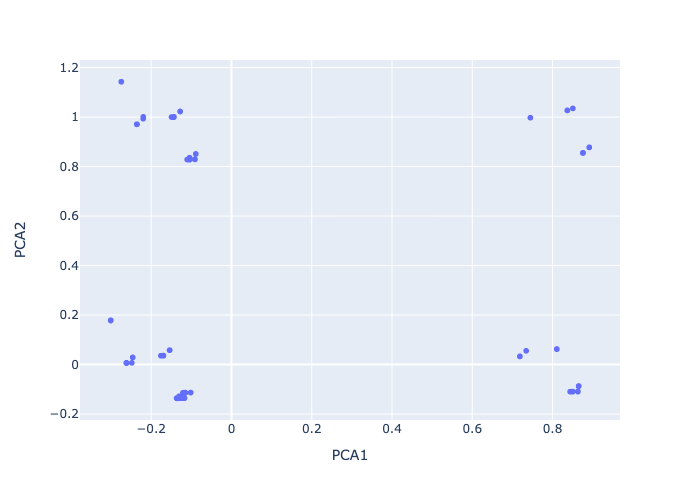

/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/plotly/express/_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



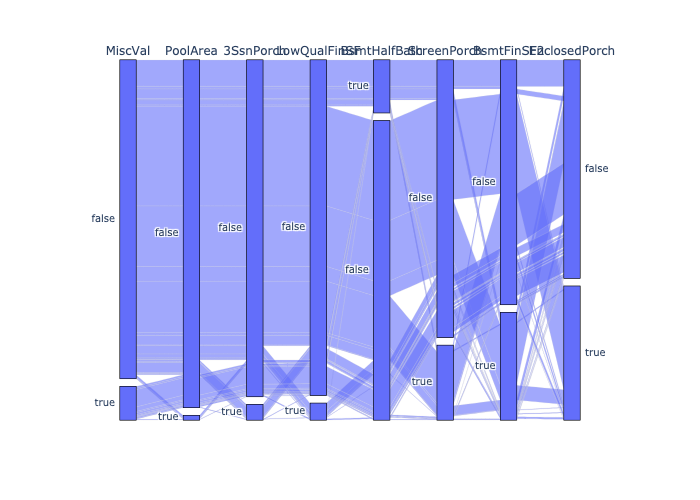

In [20]:
px.scatter(cp_train,x="PCA1", y="PCA2").show()
px.parallel_categories(
    cp_train[selector], dimensions=_feat
).show()
